In [72]:
using Unitful, UnitfulRecipes           # Unidades físicas
using FFTW                              # Transformadas de Fourier
using Plots, PlotThemes, ColorSchemes   # Gráficos
using Trapz                             # Integral Numérica

import PhysicalConstants.CODATA2014: c_0
c = c_0 |> u"km/ps"

theme(:juno)
default(size=(800,400), linewidth=2, guidefontsize=10, palette=:seaborn_deep6)

In [73]:
function ufft(y, dim=1)
    yval, yunit = ustrip.(y), unit(y[1])
    return fft(yval, dim)*yunit
end
function uifft(y, dim=1)
    yval, yunit = ustrip.(y), unit(y[1])
    return ifft(yval, dim)*yunit
end
function utrapz(x, y)
    xval, xunit = ustrip.(x), unit(x[1])
    yval, yunit = ustrip.(y), unit(y[1])
    return trapz(xval, yval)*yunit*xunit
end 
function fwhm(x, y)
    maxy = maximum(y)
    n1 = findfirst(a -> a>maxy/2, y)
    n2 = findlast(a -> a>maxy/2, y)
    return x[n2]-x[n1]
end

power(x, y) = utrapz(x, abs.(y).^2)

normalize(x, Ax, y, Ay) = Ay*sqrt(power(x, Ax)/power(y, Ay));

Primero definimos las fibras ópticas con las que vamos a trabajar, en función de sus specs para $\gamma$ y $D$.

In [74]:
struct Fibra γ; D; end

SMF = Fibra(1.2u"W^(-1)*km^(-1)", 18*u"ps/(nm*km)") 
TW_RS = Fibra(1.8u"W^(-1)*km^(-1)", 4*u"ps/(nm*km)")

println("SMF: $SMF\nTW_RS: $TW_RS")

SMF: Fibra(1.2 km^-1 W^-1, 18 ps nm^-1 km^-1)
TW_RS: Fibra(1.8 km^-1 W^-1, 4 ps nm^-1 km^-1)


Vamos a estudiar la propagación de pulsos a longitudes de onda $\lambda_1 = 1550\,\text{nm}$ y $\lambda_2 = 1550,4\,\text{nm}$, separadas por $\Delta f = 50\,\text{GHz}$

In [75]:
N = 1024
M = 2*N

λ1 = 1550u"nm"
λ2 = 1550.4u"nm"
ΔF = 50u"GHz"

println("λ1 = $λ1\nλ2 = $λ2")

λ1 = 1550 nm
λ2 = 1550.4 nm


Para poder transmitir pulsos a una tasa de $10\,\text{GB/s}$ usamos un ancho de pulso de $50\,\text{ps}$

In [76]:
T0 = 1/10e9*u"s"/2 |> u"ps"
println("T0 = $T0")

t = range(-800u"ps", 800u"ps", N)
Δf = 1/(t[2]-t[1]) |> u"GHz"
f = fftfreq(N, Δf) |> fftshift;

T0 = 50.0 ps


Importante: La ecuación de $\beta_2$ es dependiente con $\lambda$. Los pulsos propagan a longitudes de onda diferentes, para poder usar el algoritmo Split Step Fourier implementado es necesario considerar una aproximación $\beta_2(\lambda_1)\simeq\beta_2(\lambda_2)$.

Implementamos el algoritmo Split Step Fourier y los operadores de dispersión y automodulación de fase, tal como en el ejercicio anterior

In [77]:
A_gvd(Af) = Af .* exp.(im*β2/2*(2π*f).^2*h)

A_gvd (generic function with 1 method)

In [78]:
A_spm(At) = At .* exp.(im*fibra.γ*abs.(At).^2*h)

A_spm (generic function with 1 method)

In [79]:
function split_step(N_op, D_op)
    for i in 2:M
        AfD = D_op(Af[i-1,:])
        AtD = normalize(f, AfD, t, uifft(AfD))
        AtN = N_op(AtD) 
        
        Af[i,:] = normalize(t, AtN, f, ufft(AtN))
        At[i,:] = AtN 
    end
end

split_step (generic function with 1 method)

Definimos pulsos gaussianos propagando a cada longitud de onda
$$A_{01}(t)=\sqrt{P_0}\exp\left[-\frac{t^2}{2T_0^2}\right]\qquad \qquad A_{02}(t)=\sqrt{P_0}\exp\left[-\frac{t^2}{2T_0^2}\right]\exp\left[-i2\pi\, \Delta f \,t\right]$$

Anticipando un desplazamiento de un pulso respecto al otro por la ventana temporal por motivo de la diferente velocidad de grupo correspondiente a cada pulso, aplicamos un desplazamiento temporal inicial a uno de ellos
$$A_{01}(t)=\sqrt{P_0}\exp\left[-\frac{t^2}{2T_0^2}\right]\qquad \qquad A_{02}(t)=\sqrt{P_0}\exp\left[-\frac{(t-\Delta t)^2}{2T_0^2}\right]\exp\left[-i2\pi\, \Delta f \,t\right]$$

En la fibra propagará la superposición de ambos pulsos, $A_0(t) = A_{01}(t)+A_{02}(t)$

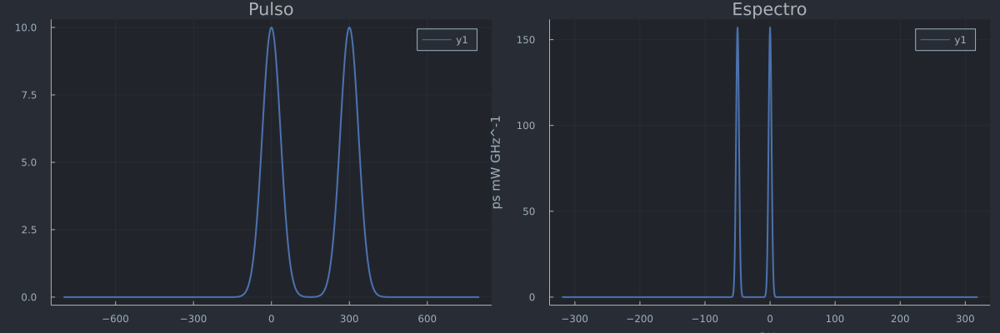

In [80]:
fibra = SMF
P0 = 10u"mW"
β2 = -λ1^2*fibra.D/(2π*c) |> u"ps^2/km"

A01 = sqrt(P0)*exp.(-t.^2/(2*T0^2))
A02 = sqrt(P0)*exp.(-(t.-6*T0).^2/(2*T0^2)).*exp.(-im*2π*(ΔF*t))

At = zeros(M,N)*(0.0+im*0.0)*u"sqrt(mW)";
Af = zeros(M,N)*(0.0+im*0.0)*u"sqrt(mW*ps/GHz)";

At[1,:] = A01.+A02
Af[1,:] = normalize(t, At[1,:], f, ufft(At[1,:]) |> fftshift)

auxf = [a < 1e-31*unit(a) ? 1e-31*unit(a) : a for a in  abs.(Af[1,:]).^2]
p1 = plot(t, abs.(At[1,:]).^2, title="Pulso")
p2 = plot(f, auxf, title="Espectro")
plot(p1, p2,size=(1200,400), layout=(1,2)) |> display

### Propagación en fibra SMF a $P_0 = 1\,\text{mW}$

Elegimos la fibra SMF, con los siguientes valores de $\gamma$ y $D$

In [81]:
fibra = SMF
println("D = $(fibra.D)\ngamma = $(fibra.γ)")

D = 18 ps nm^-1 km^-1
gamma = 1.2 km^-1 W^-1


Estudiamos el efecto de propagar los pulsos en $100\, \text{km}$ de fibra. 

Observamos el _heatmap_ de los pulsos a lo largo del recorrido:

In [82]:
function make_pulse(L, M, P0)
    z = range(0u"km", L, M)
    h = z[2]-z[1]

    β2 = -λ1^2*fibra.D/(2π*c) |> u"ps^2/km"

    A01 = sqrt(P0)*exp.(-t.^2/(2*T0^2))
    A02 = sqrt(P0)*exp.(-(t.-6*T0).^2/(2*T0^2)).*exp.(-im*2π*(ΔF*t))

    At = zeros(M,N)*(0.0+im*0.0)*u"sqrt(mW)";
    Af = zeros(M,N)*(0.0+im*0.0)*u"sqrt(mW*ps/GHz)";

    At[1,:] = A01.+A02
    Af[1,:] = normalize(t, At[1,:], f, ufft(At[1,:]) |> fftshift)
    return (z, h, β2, At, Af)
end

z, h, β2, At, Af = make_pulse(100u"km", M, 1u"mW")
split_step(A_spm, A_gvd);

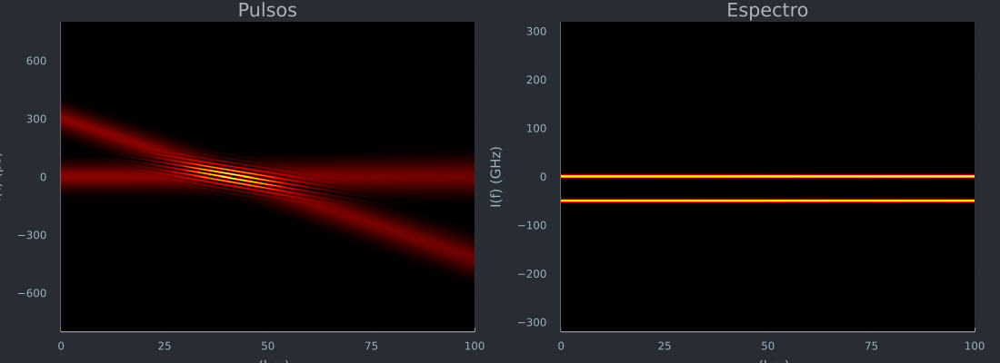

In [83]:
function heatmap_pulse()
    p1 = heatmap(z, t, abs.(At').^2, xlabel="z", ylabel="I(t)", title="Pulsos")
    p2 = heatmap(z, f, abs.(Af').^2, xlabel="z", ylabel="I(f)", title="Espectro")
    plot(p1, p2, layout=(1,2),size=(1100,400), colorbar=false, zaxis=:log) |> display
end

heatmap_pulse()

Podemos comparar la apariencia de los pulsos y el espectro a distintos valores de $z$ en el dominio del tiempo y de la frecuencia, con el fin de observar cambios en el espectro que en el _heatmap_ no se aprecian a simple vista.

Como un valor de interés en particular,observamos en el $z$ en el cual los dos pulsos se intersectan en el dominio del tiempo, lo comparamos con la forma inicial de los pulsos:

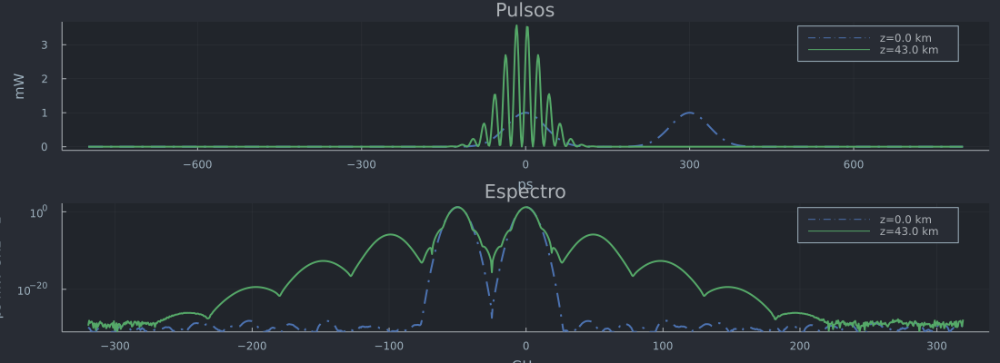

In [84]:
function plot_evolution(n)
    i=M/n |> ceil |> Int

    p1 = plot(t, abs.(At[1,:]).^2, title="Pulsos", label="z=$(z[1])", linestyle=:dashdot)
    plot!(p1, t, abs.(At[i,:]).^2, label="z=$(round(u"km", z[i]))")

    auxf = [a < 1e-31*unit(a) ? 1e-31*unit(a) : a for a in  abs.(Af[1,:]).^2]
    p2 = plot(f, auxf, title="Espectro", yaxis=:log, ylims=(1e-31*unit(Af[1,1].^2), maximum(abs.(Af[1,:]).^2)*10), label="z=$(z[1])", linestyle=:dashdot)
    auxf = [a < 1e-31*unit(a) ? 1e-31*unit(a) : a for a in  abs.(Af[i,:]).^2]
    plot!(p2, f, auxf, label="z=$(round(u"km", z[i]))")
    plot(p1, p2,size=(1100,400), layout=(2,1)) |> display
end

plot_evolution(2.3)

Comparamos con los pulsos al final del recorrido en la fibra, luego de que los pulsos se hayan intersectado y seguido su camino:

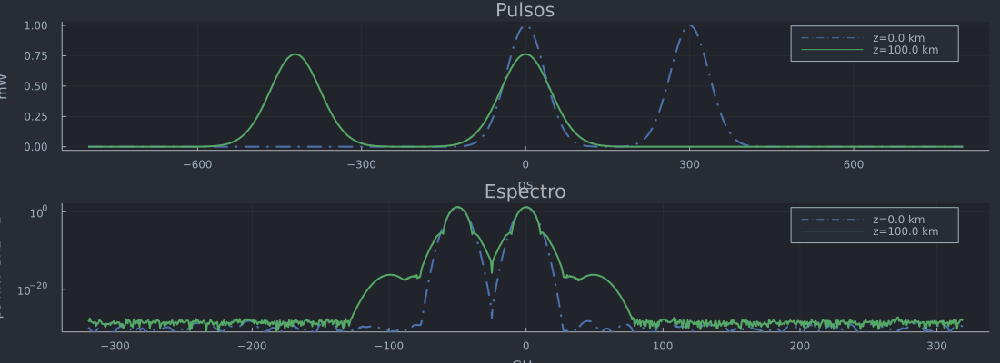

In [85]:
plot_evolution(1)

### Propagación en fibra SMF a $P_0 = 10\,\text{mW}$


A continuación, incrementamos la potencia del pulso y repetimos la simulación.

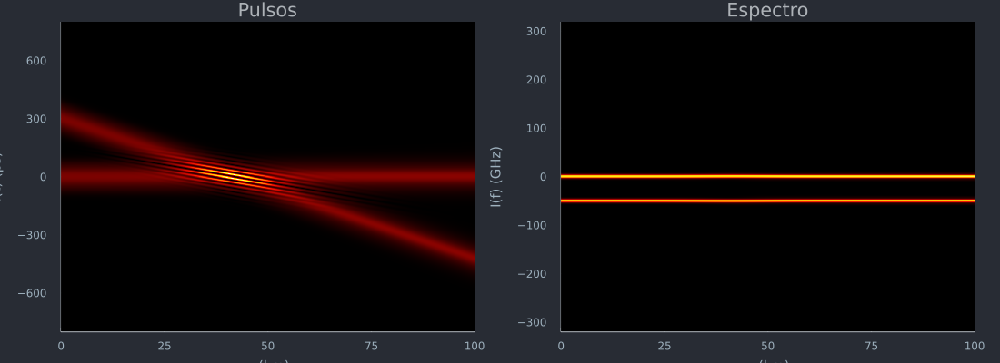

In [86]:
z, h, β2, At, Af = make_pulse(100u"km", M, 10u"mW")

split_step(A_spm, A_gvd)

heatmap_pulse()

En el $z$ de intersección de los pulsos:

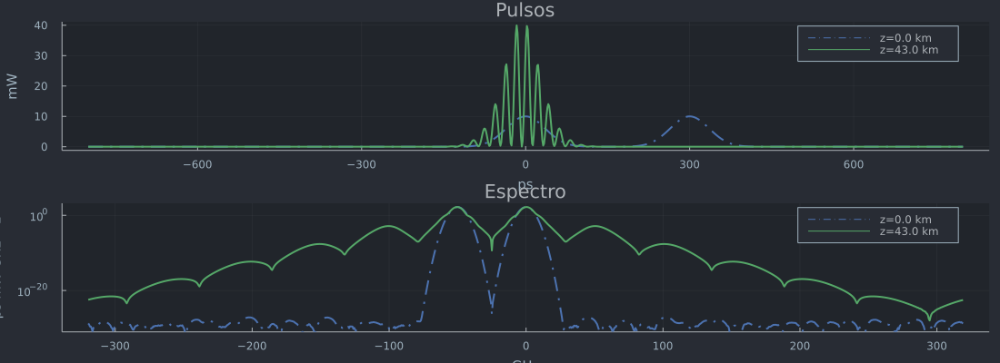

In [87]:
plot_evolution(2.3)

Al final del recorrido:

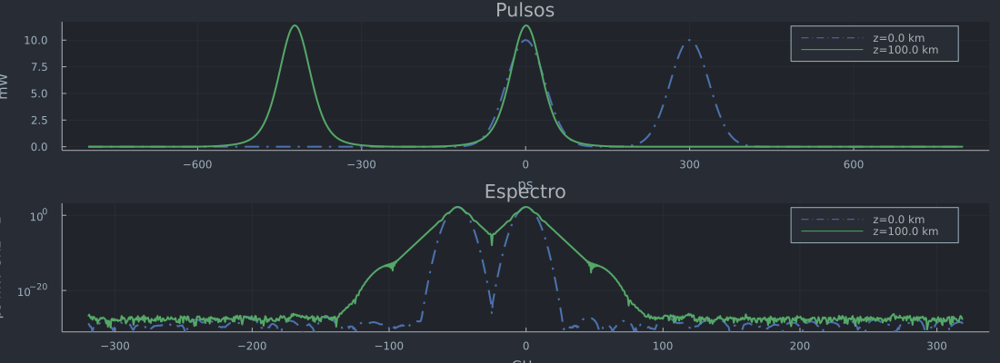

In [88]:
plot_evolution(1)

### Propagación en fibra SMF a $P_0 = 100\,\text{mW}$

Incrementamos la potencia pico aún más, y repetimos el experimento

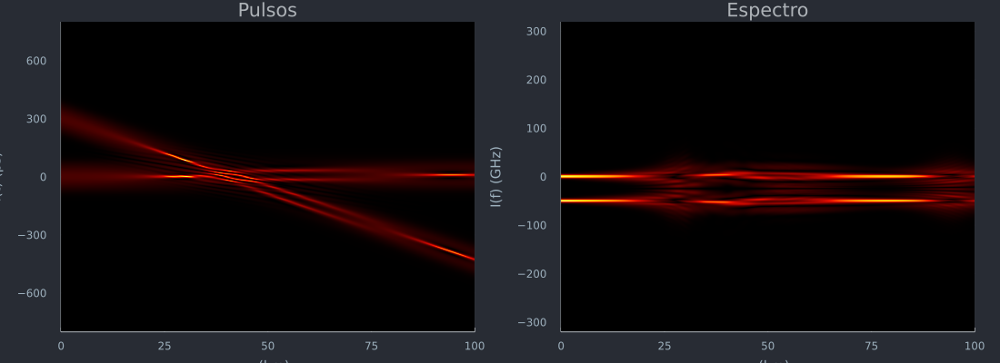

In [89]:
z, h, β2, At, Af = make_pulse(100u"km", M, 100u"mW")

split_step(A_spm, A_gvd)

heatmap_pulse()

En el $z$ de intersección de los pulsos:

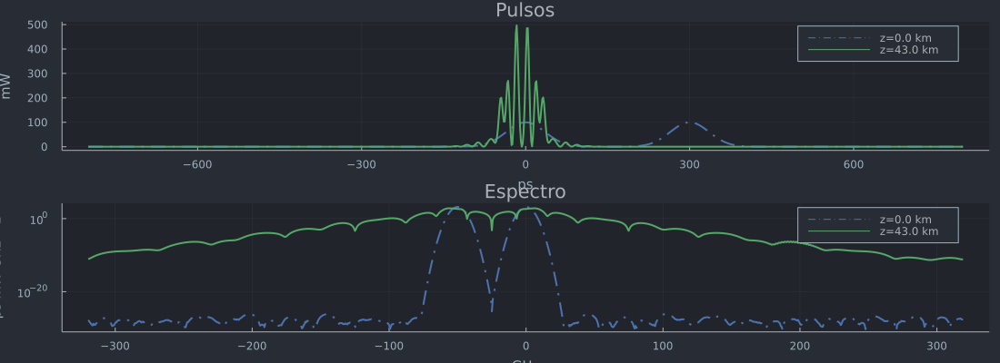

In [90]:
plot_evolution(2.3)

Al final del recorrido:

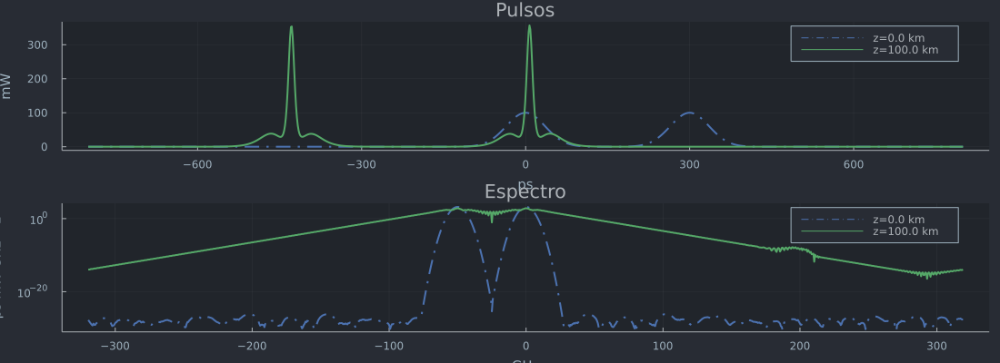

In [91]:
plot_evolution(1)

En cada caso sucede que hay una degeneración espectral en el instante en el que ambos pulsos se superponen temporalmente. 

Los pulsos continúan su recorido, y recuperan su forma espectral, pero no en su totalidad, ambos pulsos se vieron afectados por la intersección temporal. Este es el efecto de modulación de fase cruzada (XPM).

Al igual que la automodulación de fase, este efecto es proporcional a la potencia pico de los pulsos, y proporcional a el $\gamma$ de la fibra.

### Propagación en fibra TW-RS a $P_0 = 1\,\text{mW}$


Comparamos los resultados anteriores con la simulación de una fibra TW-RS, con los siguientes valores de $D$ y $\gamma$

In [92]:
fibra = TW_RS
println("D = $(fibra.D)\ngamma = $(fibra.γ)")

D = 4 ps nm^-1 km^-1
gamma = 1.8 km^-1 W^-1


En particular, $\gamma$ de esta fibra es mayor al de la fibra SMF. Esperamos ver mayor efecto de modulación de fase. Lo verificamos con la simulación.

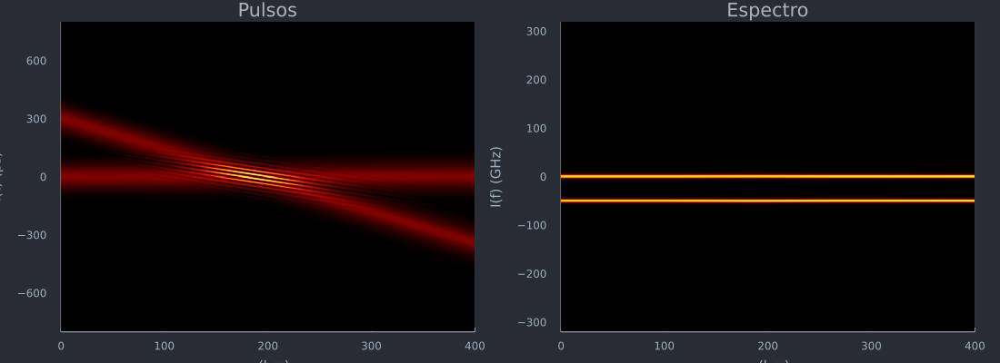

In [93]:
fibra = TW_RS
z, h, β2, At, Af = make_pulse(400u"km", M, 1u"mW")

split_step(A_spm, A_gvd)

heatmap_pulse()

En el $z$ de intersección de los pulsos:

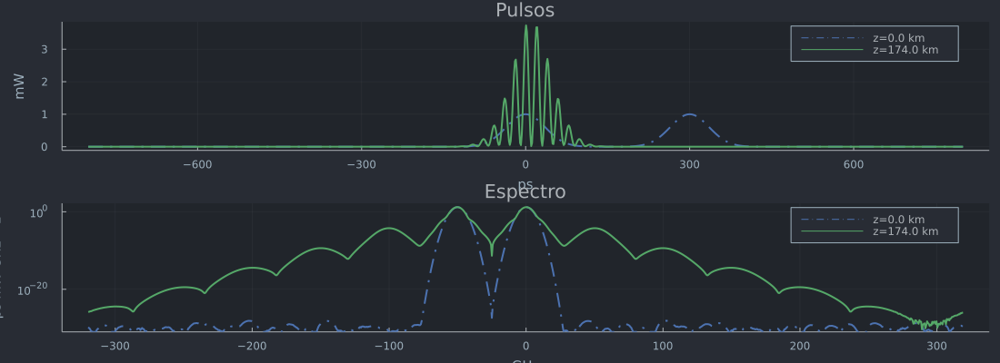

In [94]:
plot_evolution(2.3)

Al final del recorrido:

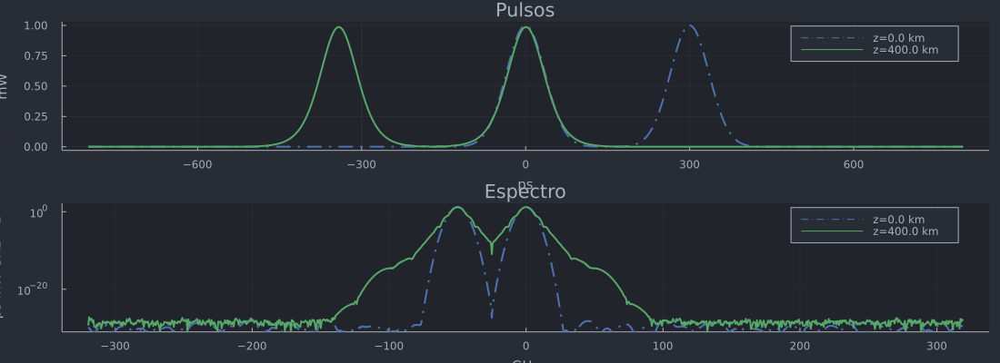

In [95]:
plot_evolution(1)

### Propagación en fibra TW-RS a $P_0 = 10\,\text{mW}$

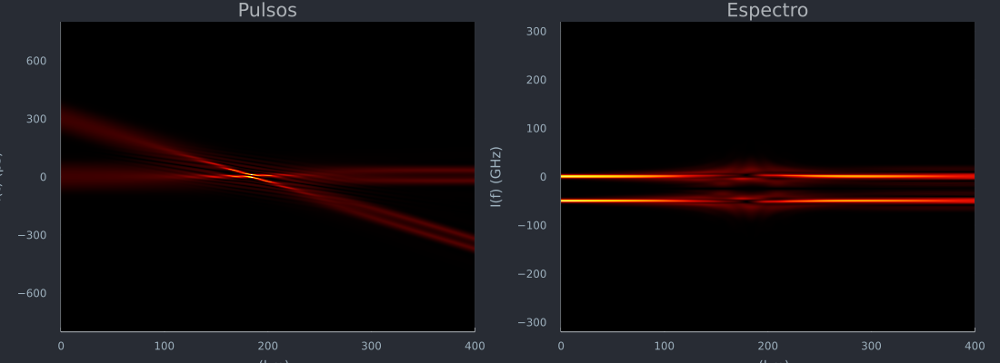

In [96]:
z, h, β2, At, Af = make_pulse(400u"km", M, 10u"mW")

split_step(A_spm, A_gvd)

heatmap_pulse()

En el $z$ de intersección de los pulsos:

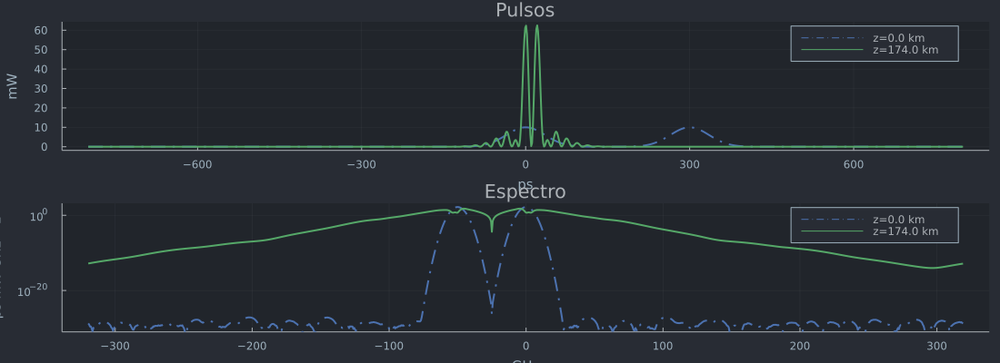

In [97]:
plot_evolution(2.3)

Al final del recorrido:

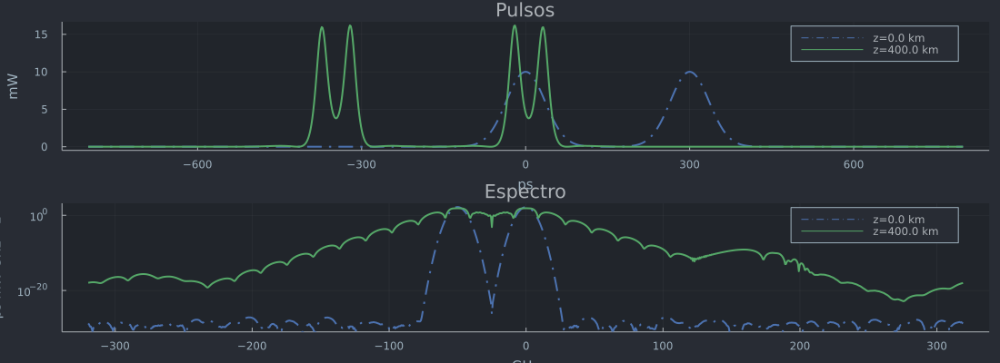

In [98]:
plot_evolution(1)

### Propagación en fibra TW-RS a $P_0 = 100\,\text{mW}$


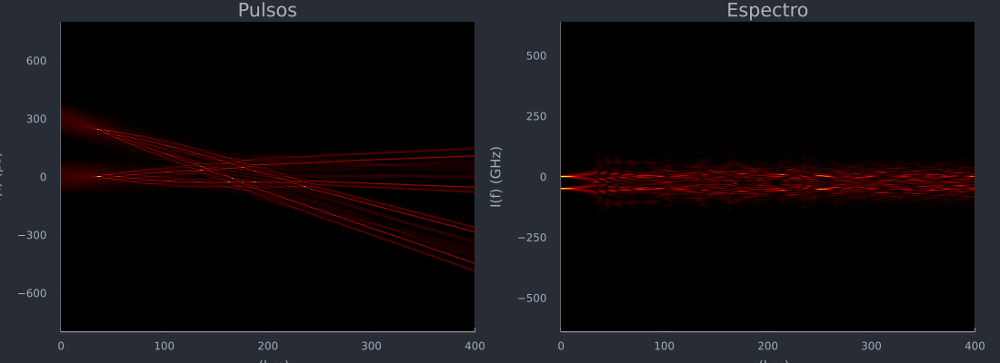

In [99]:
N = M
t = range(-800u"ps", 800u"ps", N)
Δf = 1/(t[2]-t[1]) |> u"GHz"
f = fftfreq(N, Δf) |> fftshift;

z, h, β2, At, Af = make_pulse(400u"km", M, 100u"mW")

split_step(A_spm, A_gvd)

heatmap_pulse()

En el $z$ de intersección de los pulsos:

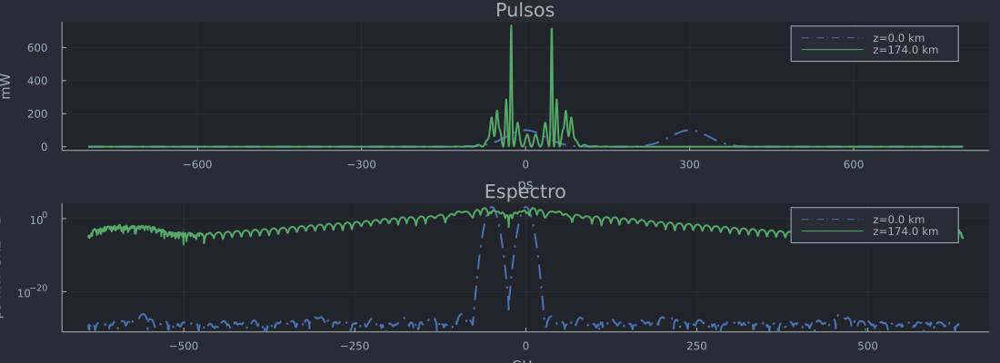

In [100]:
plot_evolution(2.3)

Al final del recorrido:

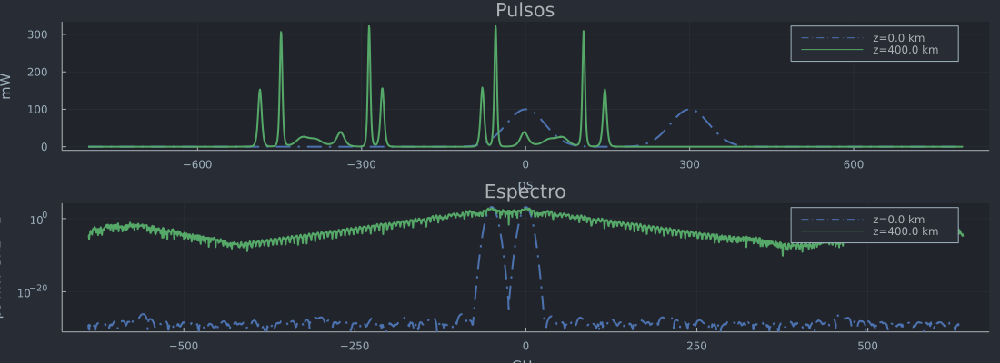

In [101]:
plot_evolution(1)

Efectivamente el efecto de la XPM mayor al de la fibra anterior. En el caso final, con potencia a $100\;\text{mW}$, la modulación de fase cruzada degenera completamente a los pulsos, y estos pierden casi todo su contenido espectral. Resulta imposible transmitir información por la fibra en esas condiciones.

### Consideraciones Finales

Es importante considerar que en una fibra óptica usada como enlace de comunicaciones, no se propagará un único pulso, se propagarán múltiples. Esto implica que un pulso viajando a longitud de onda $\lambda_1$ no se va a cruzar con un único pulso viajando a $\lambda_2$, sino con múltiples de ellos, y vice-versa.

Esto implica que el efecto de la XPM se tiene que considerar múltiples veces, dependiendo de la longitud del recorrido y la tasa de bits.

A continuación se muestra una simulación de la intersección de los pulsos múltiples veces, viajando por la fibra SMF con potencia $P_0 = 10\,\text{mW}$. 

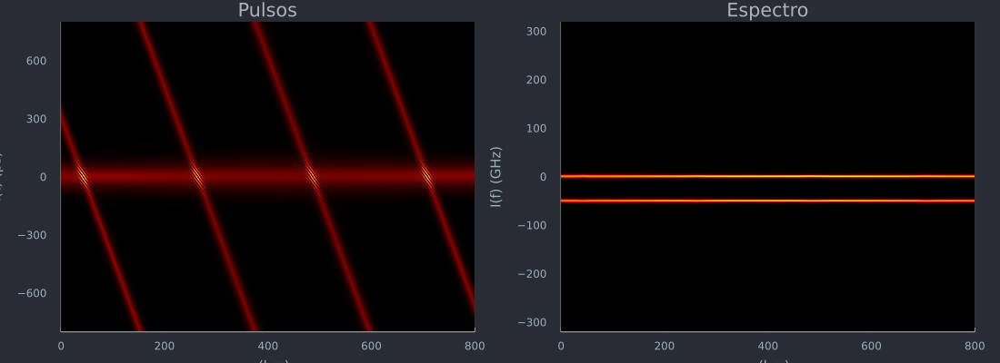

In [102]:
fibra = SMF
N = 1024

t = range(-800u"ps", 800u"ps", N)
Δf = 1/(t[2]-t[1]) |> u"GHz"
f = fftfreq(N, Δf) |> fftshift;

z, h, β2, At, Af = make_pulse(800u"km", M, 10u"mW")

split_step(A_spm, A_gvd)

heatmap_pulse()

Esta simulación es equivalente a simular la propagación de dos trenes de pulsos a distintas longitudes de onda.

Efecto de haber intersectado un único pulso:

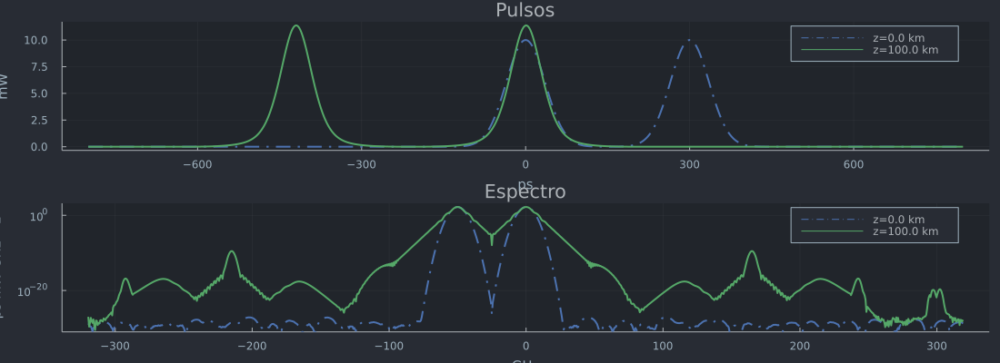

In [103]:
plot_evolution(8)

Efecto de haber intersectado 4 pulsos

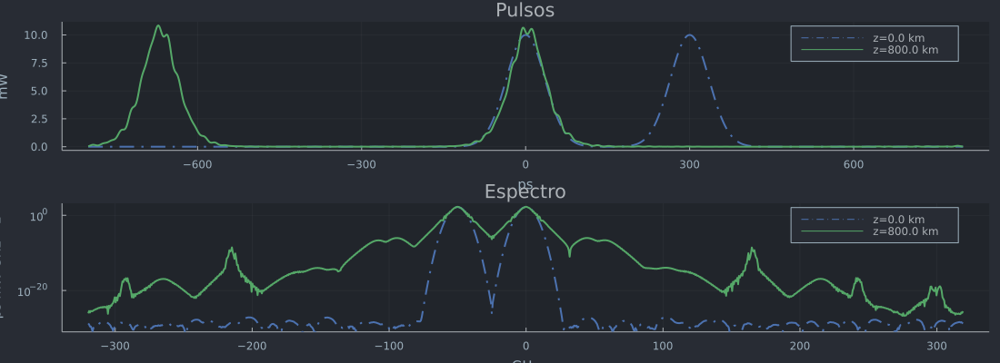

In [104]:
plot_evolution(1)

Efectivamente el efecto del XPM se acumula por cada vez que el tren de pulsos que viaja a una longitud de onda intersectan con el tren de pulsos que viaja a otra, ensanchando el espectro. Es otro aspecto de diseño a considerar si la extensión de la fibra es larga.